# Plotting MSE over Predicted MSE
Give correlation values and plot mean squared error over the predicted mean squared error.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from progressbar import progressbar as pb
import xarray as xr
from scripts.Deriv_dask import Deriv_dask
from scripts.latexify import in_params_dic, physical_params
from scripts.plot_mse import load_and_append, reduce_df
from scripts.segment_identifier import d_unnamed
from scripts.create_mse import load_and_append

### Setup
First we set some variables that define what we are going to look at. Feel free to change any of those (given that the data is available for this).

In [4]:
kind = "mse"
if kind == "mse":
    error_key = "MSE"
elif kind == "maxse":
    error_key = "Max Error"
elif kind == "nozeromse":
    error_key = "MSE (no zero)"
elif kind == "sum":
    error_key = "Cumulative Squared Error"
elif kind == "me":
    error_key = "Mean Error"
elif kind == "mae":
    error_key = "Mean Absolute Error"
    
ratio_type = "adjusted"
    
# Path to a file created by create_mse.py.
reduced_df_name = "data/stats/conv_adjusted_" + kind + "_errorMean_sensMean.csv"

Load the dataset and get correlation coefficients

In [5]:
if ".csv" in reduced_df_name:
    reduced_df = d_unnamed(pd.read_csv(reduced_df_name))
else:
    reduced_df = xr.open_dataset(reduced_df_name).to_dataframe()
    
print(f"Correlation with all data")
tmp = reduced_df.loc[reduced_df["Ratio Type"] == ratio_type]
print(tmp.corr("spearman"))
tmp = tmp.loc[tmp["Sensitivity"] != 0]
n = len(np.unique(tmp["Perturbed Parameter"]))
print(f"Correlation without zero parameters; total of {n} parameters")
print(tmp.corr("spearman"))

Correlation with all data (using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.625203
Sensitivity  0.625203     1.000000
Correlation without zero parameters (and using mean values); total of 137 parameters
                  MSE  Sensitivity
MSE          1.000000     0.876932
Sensitivity  0.876932     1.000000


Get correlation coefficients for each output parameter separately

In [8]:
out_params = ["QV", "QC", "QR", "QI", "QS", "QG", "QH"]
for out_p in out_params:
    tmp = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
    tmp = tmp.loc[tmp["Output Parameter"] == out_p]
    print(out_p)
    print(f"Correlation with all data (using mean values)")
    print(tmp.corr("spearman"))
    print("Correlation without zero parameters (and using mean values)")
    print(tmp.loc[tmp["Sensitivity"] != 0].corr("spearman"))
    print("")

QV
Correlation with all data (using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.837425
Sensitivity  0.837425     1.000000
Correlation without zero parameters (and using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.897747
Sensitivity  0.897747     1.000000

QC
Correlation with all data (using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.850073
Sensitivity  0.850073     1.000000
Correlation without zero parameters (and using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.896269
Sensitivity  0.896269     1.000000

QR
Correlation with all data (using mean values)
                  MSE  Sensitivity
MSE          1.000000     0.829184
Sensitivity  0.829184     1.000000
Correlation without zero parameters (and using mean values)
                 MSE  Sensitivity
MSE          1.00000      0.88038
Sensitivity  0.88038      1.00000

QI
Correlation with all data (using mean va

We add a Student's t-test for the correlation of predicted and actual errors although the validity is somewhat limited here. 
Student's t-test assumes both parameters are identically distributed but independently sampled. While we can assume that the distribution is somewhat similar given that the algorithmic differentiation gives estimates for the errors, the samples are not independently drawn. This is more for fun and possibly future datasets.

In [9]:
from scipy.stats import t as student_t

alpha = 0.01


def ip(x, df):
    return np.sqrt(x * x / (df + x * x))


print(f"Significance test (we use p={alpha}):")
r_1 = tmp.corr("spearman")["Sensitivity"].iloc[0]
r_2 = tmp.loc[tmp["Sensitivity"] != 0].corr("spearman")["Sensitivity"].iloc[0]
print(f"Correlation for all data: {r_1}\nCorrelation without zero parameters: {r_2}")

# print("p-value using Fisher transformation")
n_1 = len(tmp.index)
n_2 = len(tmp.loc[tmp["Sensitivity"] != 0].index)
# def F(r):
#     return 0.5 * np.log( (1+r)/(1-r) )
# z_1 = np.sqrt( (n_1 - 3)/1.06 ) * F(r_1)
# z_2 = np.sqrt( (n_2 - 3)/1.06 ) * F(r_2)
# print(f"For all data: {1-norm.cdf(z_1)}\nWithout zero parameters: {1-norm.cdf(z_2)}")

print("p-value using Student's t-distribution")
dof_1 = n_1 - 2
dof_2 = n_2 - 2
t_1 = r_1 * np.sqrt(dof_1 / (1 - r_1 * r_1))
t_2 = r_2 * np.sqrt(dof_2 / (1 - r_2 * r_2))
print(
    f"test statictic should be higher than {ip(student_t.ppf(alpha, df=dof_1), df=dof_1 )} ({ip(student_t.ppf(alpha, df=dof_2), df=dof_2 )} without zero parameters)"
)
print(f"test statictic: {t_1} and {t_2}")
print(
    f"Probability that these parameters correlate by accident: {1-student_t.cdf(t_1, df=dof_1)}\nWithout zero parameters: {1-student_t.cdf(t_2, df=dof_2)}"
)


Significance test (we use p=0.01):
Correlation for all data: 0.8074579038546131
Correlation without zero parameters: 0.8888658904380708
p-value using Student's t-distribution
test statictic should be higher than 0.11868299068054929 (0.20079571368976748 without zero parameters)
test statictic: 26.75189973675516 and 22.289429728749376
Probability that these parameters correlate by accident: 0.0
Without zero parameters: 0.0


### Plotting Ensemble Errors Over Predicted Errors
We start with a setup. Feel free to modify anything here. There is a script "scripts/plot_mse.py" that uses the same functions albeit with different configurations used in the paper. Feel free to change some variables

In [8]:
out_params = ["QV", "QC", "QR", "QI", "QS", "QG", "QH"]
in_params = np.unique(reduced_df["Perturbed Parameter"])

datashade = False
alpha = 0.5
s = 13
f_limits = (-2, 2)
store_path = "pics/"
confidence = 0.90
hist = True
kind = "grid_plot"
abs_x = True
log_x = True
log_y = True
log_func = np.log10
# Set this to true if you want to save each plot independently
plot_singles = False

# Dummy for plotting
mean_traj = Deriv_dask(
    direc="",
    parquet=False,
    netcdf=True,
    columns=None,
    backend="matplotlib",
    file_ending="",
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Plot to pics/MSE_001
Plot to pics/MSE_002


Plot to pics/MSE_003


Plot to pics/MSE_004


Plot to pics/MSE_005


Plot to pics/MSE_006


Plot to pics/MSE_007


Plot to pics/MSE_008


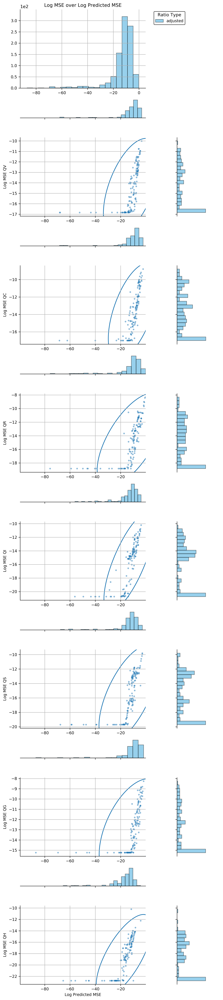

In [11]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df = tmp_df.loc[tmp_df["Sensitivity"] != 0]
mean_traj.plot_mse(
    out_params=out_params,
    mse_df_=tmp_df,
    in_params=in_params,
    datashade=datashade,
    alpha=alpha,
    formatter_limits=f_limits,
    s=s,
    hist=hist,
    confidence=confidence,
    abs_x=abs_x,
    log_x=log_x,
    log_y=log_y,
    kind=kind,
    error_key=error_key,
    xlabel="Log Predicted MSE",
    plot_singles=plot_singles,
    log_func=log_func
)

Plot parameters with zero predicted impact to the far left

/uni-mainz.de/homes/mahieron/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Plot to pics/MSE_010


Plot to pics/MSE_011
Plot to pics/MSE_012


Plot to pics/MSE_013


Plot to pics/MSE_014


Plot to pics/MSE_015


Plot to pics/MSE_016


Plot to pics/MSE_017


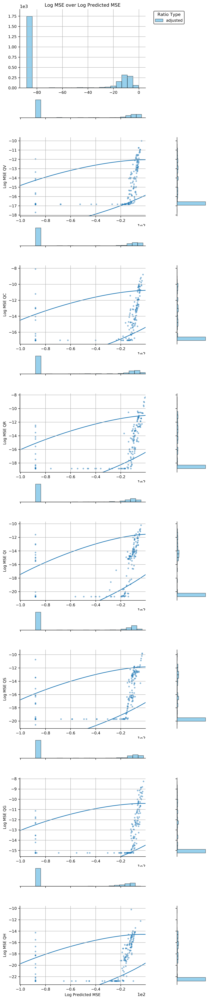

In [12]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
min_sens = tmp_df.loc[tmp_df["Sensitivity"] != 0]["Sensitivity"].min()/10
tmp_df.loc[tmp_df["Sensitivity"] == 0, "Sensitivity"] = min_sens
mean_traj.plot_mse(
    out_params=out_params,
    mse_df_=tmp_df,
    in_params=in_params,
    datashade=datashade,
    alpha=alpha,
    formatter_limits=f_limits,
    s=s,
    hist=hist,
    confidence=confidence,
    abs_x=abs_x,
    log_x=log_x,
    log_y=log_y,
    kind=kind,
    error_key=error_key,
    xlabel="Log Predicted MSE",
    plot_singles=plot_singles,
    log_func=log_func
)

Plot only parameters with a high predicted impact

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

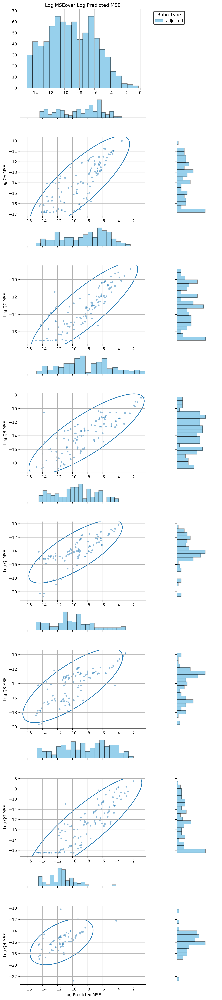

In [9]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df = tmp_df.loc[tmp_df["Sensitivity"] >= 1e-15]
mean_traj.plot_mse(
    out_params=out_params,
    mse_df_=tmp_df,
    in_params=in_params,
    datashade=datashade,
    alpha=alpha,
    formatter_limits=f_limits,
    s=s,
    hist=hist,
    confidence=confidence,
    abs_x=abs_x,
    log_x=log_x,
    log_y=log_y,
    kind=kind,
    error_key=error_key,
    xlabel="Log Predicted MSE",
    plot_singles=plot_singles,
    log_func=log_func,
)

### Get the most important parameters
We print the 20 most important input parameters for each output parameter and the 20 most important input parameters according to prediction

In [13]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df = tmp_df.loc[tmp_df["Sensitivity"] != 0]
for out_p in out_params:
    print(f"########################### {out_p} ########################")
    df = tmp_df.loc[tmp_df["Output Parameter"] == out_p]
    print("sort by sensitivity")
    print(
        df.nlargest(20, "Sensitivity")[
            ["Perturbed Parameter", error_key, "Sensitivity"]
        ]
    )
    print(f"sort by {error_key}")
    print(df.nlargest(20, error_key)[["Perturbed Parameter", error_key, "Sensitivity"]])
    df.nlargest(20, "Sensitivity")[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ].to_csv(out_p + "_sens.csv", sep=".", decimal=",")
    df.nlargest(20, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ].to_csv(out_p + "_sim.csv", sep=".", decimal=",")


########################### QV ########################
sort by sensitivity
     Perturbed Parameter           MSE   Sensitivity
7266      dgraupel_b_geo  9.678883e-11  4.423168e-04
7557          dice_b_geo  1.071999e-11  3.600508e-05
7245      dgraupel_a_geo  1.103891e-11  3.409022e-05
7269      dgraupel_b_vel  1.083042e-11  2.839048e-05
7938         dsnow_b_geo  5.712212e-12  2.308208e-05
7278        dgraupel_c_s  8.369689e-12  1.758915e-05
7263        dgraupel_b_f  7.267585e-12  1.480710e-05
7728  dp_sat_ice_const_b  5.138423e-12  6.874120e-06
7248      dgraupel_a_vel  1.272619e-12  3.105323e-06
6957         dT_mult_min  1.715493e-11  2.635015e-06
6984            da_prime  5.554158e-13  2.513298e-06
7020                db_v  4.296195e-13  2.151437e-06
7071        dcloud_b_geo  1.719477e-11  1.823213e-06
6954         dT_mult_max  2.968174e-12  1.394164e-06
7017            db_prime  1.632843e-13  7.508198e-07
7011            db_ccn_4  1.593936e-13  6.984987e-07
7038            dc_ccn_

Now we check, which parameters are in the top 10 of one but not in the top 20 of the other and their range

In [21]:
import scripts.latexify as latexify

tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df = tmp_df.loc[tmp_df["Sensitivity"] != 0]
latex_dic_err = {}
latex_dic_ad = {}
descr_dic = {}
for out_p in out_params:
    print(f"########################### {out_p} ########################")
    df = tmp_df.loc[tmp_df["Output Parameter"] == out_p]
    top20_sens = df.nlargest(20, "Sensitivity")[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    top10_sens = df.nlargest(10, "Sensitivity")[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    top20_erro = df.nlargest(20, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    top10_erro = df.nlargest(10, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    print("in sort by sensitivity top 10 but not in error top 20")
    tmp = top10_sens.merge(top20_erro, how="left", on="Perturbed Parameter")
    tmp = tmp[tmp["MSE_y"].isna()]
    print(tmp)
    if not tmp.empty:
        latex_dic_ad[out_p] = []
        for idx, row in tmp.iterrows():
            latex_dic_ad[out_p].append(
                latexify.parse_word(row["Perturbed Parameter"])
                + " & "
                + f"$ {row.MSE_x:1.2e} $"
                + " & "
                + f"$ {row.Sensitivity_x:1.2e} $"
            )
            descr_dic[row["Perturbed Parameter"]] = latexify.in_params_descr_dic[
                row["Perturbed Parameter"]
            ]
    print("in sort by error top 10 but not in sensitivity top 20")
    tmp = top10_erro.merge(top20_sens, how="left", on="Perturbed Parameter")
    tmp = tmp[tmp["MSE_y"].isna()]
    print(tmp)
    if not tmp.empty:
        latex_dic_err[out_p] = []
        for idx, row in tmp.iterrows():
            latex_dic_err[out_p].append(
                latexify.parse_word(row["Perturbed Parameter"])
                + " & "
                + f"$ {row.MSE_x:1.2e} $"
                + " & "
                + f"$ {row.Sensitivity_x:1.2e} $"
            )
            descr_dic[row["Perturbed Parameter"]] = latexify.in_params_descr_dic[
                row["Perturbed Parameter"]
            ]


########################### QV ########################
in sort by sensitivity top 10 but not in error top 20
Empty DataFrame
Columns: [Perturbed Parameter, MSE_x, Sensitivity_x, MSE_y, Sensitivity_y]
Index: []
in sort by error top 10 but not in sensitivity top 20
Empty DataFrame
Columns: [Perturbed Parameter, MSE_x, Sensitivity_x, MSE_y, Sensitivity_y]
Index: []
########################### QC ########################
in sort by sensitivity top 10 but not in error top 20
  Perturbed Parameter         MSE_x  Sensitivity_x  MSE_y  Sensitivity_y
6      dgraupel_a_vel  1.843493e-11       0.000065    NaN            NaN
8    dgraupel_ecoll_c  1.813626e-11       0.000043    NaN            NaN
in sort by error top 10 but not in sensitivity top 20
  Perturbed Parameter         MSE_x  Sensitivity_x  MSE_y  Sensitivity_y
7            dd_ccn_4  9.731156e-11       0.000003    NaN            NaN
9            da_ccn_4  6.951042e-11       0.000003    NaN            NaN
########################### QR #

Here we get Latex-code to populate a table. Feel free to skip it

In [22]:
print("In top 10 according to MSE but not in top 20 according to AD")
for key in latex_dic_err:
    print(key)
    for val in latex_dic_err[key]:
        print(val)

print("In top 10 according to AD but not in top 20 MSE")
for key in latex_dic_ad:
    print(key)
    for val in latex_dic_ad[key]:
        print(val)
print("Descriptions")
descr_dic

In top 10 according to MSE but not in top 20 according to AD
QC
$\partial d_ccn_4 $ & $ 9.73e-11 $ & $ 3.45e-06 $
$\partial a_ccn_4 $ & $ 6.95e-11 $ & $ 2.72e-06 $
QR
$\partial T_{\mathrm{mult}, \mathrm{max}}$ & $ 3.90e-11 $ & $ 3.18e-07 $
$\partial b_ccn_4 $ & $ 2.74e-11 $ & $ 6.05e-07 $
$\partial \nu_{\mathrm{rain}} $ & $ 2.72e-11 $ & $ 1.53e-14 $
QI
$\partial \mathrm{geo}_{b, \mathrm{cloud}} $ & $ 3.19e-12 $ & $ 1.99e-08 $
$\partial s_{c, \mathrm{graupel}} $ & $ 2.07e-12 $ & $ 2.02e-09 $
QS
$\partial d_ccn_4 $ & $ 1.67e-12 $ & $ 8.05e-10 $
$\partial a_ccn_4 $ & $ 1.50e-12 $ & $ 6.79e-10 $
QG
$\partial \alpha_{\mathrm{rain}} $ & $ 7.09e-10 $ & $ 9.90e-06 $
$\partial T_{\mathrm{mult}, \mathrm{max}}$ & $ 7.07e-10 $ & $ 3.22e-07 $
QH
$\partial \mu_{\mathrm{rain}} $ & $ 6.06e-11 $ & $ 2.70e-12 $
In top 10 according to AD but not in top 20 MSE
QC
$\partial \mathrm{vel}_{a, \mathrm{graupel}} $ & $ 1.84e-11 $ & $ 6.47e-05 $
$\partial c_{ecoll, \mathrm{graupel}} $ & $ 1.81e-11 $ & $ 4.26e-05

{'dgraupel_a_vel': 'Coefficient for particle velocity',
 'dgraupel_ecoll_c': 'Riming coefficient. Maximum collision efficiency with cloud droplets',
 'dd_ccn_4': 'Parameter for calculating CCN concentration during CCN activation after Hande et al 2016',
 'da_ccn_4': 'Parameter for calculating CCN concentration during CCN activation after Hande et al 2016',
 'drain_mu': 'Shape parameter of the generalized $\\Gamma$-distribution',
 'dT_mult_max': 'Coefficient used in Hallet-Mossop ice multiplication',
 'db_ccn_4': 'Parameter for calculating CCN concentration during CCN activation after Hande et al 2016',
 'drain_nu': 'Shape parameter of the generalized $\\Gamma$-distribution',
 'drain_b_vel': 'Exponent for particle velocity',
 'drain_b_geo': 'Exponent for diameter size calculation',
 'dcloud_b_geo': 'Exponent for diameter size calculation',
 'dgraupel_c_s': 'Inverse of capacity. Coefficient in evaporation and vapor deposition',
 'drain_g2': 'Right edge of incomplete gamma function,  whic

Let's see what happens if take parameters into account that showed no sensitivity

In [24]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
table_dic = {}
for out_p in out_params:
    print(f"########################### {out_p} ########################")
    df = tmp_df.loc[tmp_df["Output Parameter"] == out_p]
    print("sort by sensitivity")
    print(
        df.nlargest(20, "Sensitivity")[
            ["Perturbed Parameter", error_key, "Sensitivity"]
        ]
    )
    tmp = df.nlargest(20, "Sensitivity")[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    for idx, row in tmp.iterrows():
        table_dic[row["Perturbed Parameter"]] = (
            latexify.parse_word(row["Perturbed Parameter"])
            + " & "
            + f"$ {row.MSE:1.2e} $"
            + " & "
            + f"$ {row.Sensitivity:1.2e} $ & "
            + latexify.in_params_descr_dic[row["Perturbed Parameter"]]
            + " \\\\ "
        )

    print(f"sort by {error_key}")
    print(df.nlargest(20, error_key)[["Perturbed Parameter", error_key, "Sensitivity"]])
    df.nlargest(20, "Sensitivity")[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ].to_csv(out_p + "_sens_all.csv", sep=".", decimal=",")
    df.nlargest(20, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ].to_csv(out_p + "_sim_all.csv", sep=".", decimal=",")


########################### QV ########################
sort by sensitivity
     Perturbed Parameter           MSE   Sensitivity
7266      dgraupel_b_geo  9.678883e-11  4.423168e-04
7557          dice_b_geo  1.071999e-11  3.600508e-05
7245      dgraupel_a_geo  1.103891e-11  3.409022e-05
7269      dgraupel_b_vel  1.083042e-11  2.839048e-05
7938         dsnow_b_geo  5.712212e-12  2.308208e-05
7278        dgraupel_c_s  8.369689e-12  1.758915e-05
7263        dgraupel_b_f  7.267585e-12  1.480710e-05
7728  dp_sat_ice_const_b  5.138423e-12  6.874120e-06
7248      dgraupel_a_vel  1.272619e-12  3.105323e-06
6957         dT_mult_min  1.715493e-11  2.635015e-06
6984            da_prime  5.554158e-13  2.513298e-06
7020                db_v  4.296195e-13  2.151437e-06
7071        dcloud_b_geo  1.719477e-11  1.823213e-06
6954         dT_mult_max  2.968174e-12  1.394164e-06
7017            db_prime  1.632843e-13  7.508198e-07
7011            db_ccn_4  1.593936e-13  6.984987e-07
7038            dc_ccn_

In [26]:
for key in table_dic:
    print(table_dic[key])
print(f"There are {len(table_dic)} different input parameters")

$\partial \mathrm{geo}_{b, \mathrm{graupel}} $ & $ 9.51e-15 $ & $ 5.41e-11 $ & Exponent for diameter size calculation \\ 
$\partial \mathrm{geo}_{b, \mathrm{ice}} $ & $ 4.53e-10 $ & $ 4.55e-05 $ & Exponent for diameter size calculation \\ 
$\partial \mathrm{geo}_{a, \mathrm{graupel}} $ & $ 3.71e-10 $ & $ 1.08e-03 $ & Coefficient for diameter size calculation \\ 
$\partial \mathrm{vel}_{b, \mathrm{graupel}} $ & $ 4.88e-15 $ & $ 1.58e-11 $ & Exponent for particle velocity \\ 
$\partial \mathrm{geo}_{b, \mathrm{snow}} $ & $ 6.93e-15 $ & $ 1.72e-09 $ & Exponent for diameter size calculation \\ 
$\partial s_{c, \mathrm{graupel}} $ & $ 2.32e-11 $ & $ 5.32e-05 $ & Inverse of capacity. Coefficient in evaporation and vapor deposition \\ 
$\partial f_{b, \mathrm{graupel}} $ & $ 2.25e-11 $ & $ 4.38e-05 $ & Coefficient for average ventilation \\ 
$\partial p_{\mathrm{sat}, \mathrm{ice}, b}$ & $ 3.20e-13 $ & $ 7.74e-08 $ & Parameter for saturation adjustment. Constant saturated ice pressure \\ 
$\p

And now only those parameters that showed no sensitivity at all and had a large error (> than top 50)

In [13]:
tmp_df = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df = tmp_df.loc[tmp_df["Sensitivity"] == 0]
tmp_df2 = reduced_df.loc[reduced_df["Ratio Type"] == "adjusted"]
tmp_df2 = tmp_df2.loc[tmp_df2["Sensitivity"] != 0]
print(
    tmp_df.nlargest(20, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity", "Output Parameter"]
    ]
)
for out_p in out_params:
    print(f"########################### {out_p} ########################")
    df = tmp_df.loc[tmp_df["Output Parameter"] == out_p]
    df2 = tmp_df2.loc[tmp_df2["Output Parameter"] == out_p]
    nlargest50 = df2.nlargest(50, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ]
    min_sens = nlargest50[error_key].min()
    df_3 = df.loc[df[error_key] >= min_sens]
    print(f"sort by {error_key} with errors > {min_sens}")
    print(
        df_3.nlargest(20, error_key)[["Perturbed Parameter", error_key, "Sensitivity"]]
    )
    df.nlargest(20, error_key)[
        ["Perturbed Parameter", error_key, "Sensitivity"]
    ].to_csv(out_p + "_sim_zeros.csv", sep=".", decimal=",")


     Perturbed Parameter           MSE  Sensitivity Output Parameter
906           drain_cmu5  8.056373e-09          0.0               QC
5799                dT_f  1.760220e-11          0.0               QS
1191                dT_f  7.280711e-12          0.0               QG
39                  dT_f  6.121460e-12          0.0               QC
4362          drain_cmu5  2.465504e-12          0.0               QI
1170           dD_crit_r  1.766931e-12          0.0               QG
1986           dq_crit_r  1.347743e-12          0.0               QG
6951                dT_f  1.081251e-12          0.0               QV
2058          drain_cmu5  5.031360e-13          0.0               QG
1203              dT_nuc  4.456886e-13          0.0               QG
4626           dD_crit_r  3.334752e-13          0.0               QR
5442           dq_crit_r  2.030321e-13          0.0               QR
834            dq_crit_r  1.171271e-13          0.0               QC
3507              dT_nuc  9.945604

### Plot (Predicted) MSE over Time
More for illustration than anything else. Plot MSE and predicted MSE for a single trajectory over time.
We start with a function that does everything at once, from loading to plotting the data for multiple input parameters.

In [ ]:
def plot_sens_param(
    path,
    out_params,
    in_params,
    traj=0,
    min_x=None,
    max_x=None,
    plot_differences=False,
    store_path=None,
):
    """
    Parameters
    ----------
    path : path
        Path to folder where ensembles are stored.
    out_params : list of string
        List of output parameters, where each output parameter gets a plot.
    in_params : list of string
        List of input parameters, where each input parameter gets a plot.
    traj : int
        Index of trajectory to plot.
    min_x : int or None
        Minimum time with respect to start of ascent (should be a multiple of 20 s after minimum
        time in the file). If None is given, plot from the beginning of time.
    max_x : int or None
        Maximum time with respect to start of ascent (should be a multiple of 20 s after min_x). If None is
        given, plot till the end of time.
    plot_differences : bool
        If true, plot the differences between MSE and predicted MSE.
    store_path : path or None
        If None is given, do not save images to disk. Otherwise save plots to given path.
    """

    def my_little_loader(path, f, out_ps, min_x, max_x):
        ds = xr.open_dataset(path + f, decode_times=False)[
            out_ps + ["time_after_ascent"]
        ]
        return ds.sel(time=np.arange(min_x, max_x + 20, 20)).compute()

    sensitivities = Deriv_dask(
        direc=path,  
        parquet=False,
        netcdf=True,
        columns=None,
        backend="matplotlib",
        file_ending="traj" + str(traj) + "_notPerturbed.nc_wcb",
    )

    sensitivities.cache_data(
        in_params=in_params,
        out_params=out_params + ["pressure"],
        x_axis="time_after_ascent",
        y_axis="pressure",
        compute=True,
        trajectories=None,
        min_x=min_x,
        max_x=max_x,
    )
    sens_df = sensitivities._recalc_ratios(
        sensitivities.cache, "adjusted", None, in_params
    )
    min_x = np.min(sensitivities.cache["time"])
    max_x = np.max(sensitivities.cache["time"])
    if plot_differences:
        sens_df[in_params] = sens_df[in_params] ** 2
        twin_label = "Squared Predicted Error (10% Perturbance)"
    else:
        twin_label = "Predicted Error (10% Perturbance)"

    def Hlarry_Plotter(s_df, e_df, y, out_param):
        lower_y = np.min(s_df[y])
        upper_y = np.max(s_df[y])
        delta = (upper_y - lower_y) / 6
        lower_y -= delta
        upper_y += delta

        def twinx_per_timestep(plot, element):
            ax = plot.handles["axis"]
            twinax = ax.twinx()
            twinax.set_ylim((lower_y, upper_y))
            twinax.set_ylabel(twin_label)
            plot.handles["axis"] = twinax

        def hook(plot, element):
            plot.handles["text_1_glyph"].text_font_size = "16pt"
            plot.handles["text_2_glyph"].text_font_size = "16pt"

        renderer = hv.Store.renderers["matplotlib"].instance(fig="png", dpi=300)

        min_t = np.min(s_df["time_after_ascent"])
        max_t = np.max(s_df["time_after_ascent"])
        t = -1000
        perturb_lines = None
        while t < max_t:
            if t < min_t:
                t += 1800
                continue
            if perturb_lines is None:
                perturb_lines = hv.VLine(x=t).opts(color="black")
            else:
                perturb_lines *= hv.VLine(x=t).opts(color="black")
            t += 1800
        twin = s_df.hvplot.scatter(
            x="time_after_ascent",
            y=y,
            color="red",
            label=latexify.parse_word(y).replace("{", "{{").replace("}", "}}"),
            alpha=0.3,
            legend=True,
        ).opts(initial_hooks=[twinx_per_timestep], apply_ranges=False)
        if plot_differences:
            title = "MSE " + latexify.parse_word(out_param).replace("{", "{{").replace(
                "}", "}}"
            )
        else:
            title = latexify.parse_word(out_param).replace("{", "{{").replace("}", "}}")
        pl = (
            e_df.hvplot.scatter(
                x="time_after_ascent",
                y=out_param,
                aspect=10 / 10,
                alpha=0.3,
                label=title,
                ylabel=title,
            )
            * twin
            * perturb_lines
        ).opts(fig_inches=5, title=title + " Error")
        renderer.save(pl, store_path + out_param + "_" + y)
        return pl

    if plot_differences:
        mean_dic = {}
        for out_param in out_params:
            mean_dic[out_param] = np.reshape(
                np.asarray(
                    sensitivities.cache.loc[
                        sensitivities.cache["Output Parameter"] == out_param
                    ][out_param]
                ),
                (
                    len(
                        sensitivities.cache.loc[
                            sensitivities.cache["Output Parameter"] == out_param
                        ][out_param].index
                    ),
                    1,
                    1,
                ),
            )

    all_pl = None
    for in_p in in_params:
        d = in_p[1::]
        ens_df = my_little_loader(
            path + "traj" + str(traj) + "/", d + ".nc_wcb", out_params, min_x, max_x
        )

        if plot_differences:
            plot_dic = {
                "time_after_ascent": np.unique(sensitivities.cache["time_after_ascent"])
            }
            for out_p in out_params:
                plot_dic[out_p] = np.mean(
                    (ens_df[out_p] - mean_dic[out_p]) ** 2, axis=(1, 2)
                )
            plot_df = pd.DataFrame.from_dict(plot_dic)
        else:
            plot_df = ens_df
        for out_p in out_params:
            sens_tmp_df = sens_df.loc[sens_df["Output Parameter"] == out_p]
            pl = Hlarry_Plotter(sens_tmp_df, plot_df, in_p, out_p)
            if all_pl is not None:
                all_pl += pl
            else:
                all_pl = pl
    try:
        return all_pl.cols(2)
    except:
        return all_pl


Again a setup for the following plot where you may change everything. In addition we get the top 20 input parameters for each output parameter (again) for plotting

In [ ]:
top20_sens_dic = {}
out_params = ["QV", "QC", "QR", "QI", "QG", "QH", "QS"]
for out_p in out_params:
    df = reduced_df.loc[reduced_df["Output Parameter"] == out_p]
    top20_sens_dic[out_p] = list(
        np.unique(df.nlargest(20, "Sensitivity")["Perturbed Parameter"])
    )

path = "/data/project/wcb/netcdf/perturbed_ensembles/conv_600_0_traj_t000000_p001/"
traj_index = 0
output_params = ["QC"]
input_params = top20_sens_dic["QC"]
max_x = 5000
plot_differences = True  # Plot the squared differences of predicted and actual error

plot_sens_param(
    path,
    output_params,
    input_params,
    traj_index,
    max_x=max_x,
    plot_differences=plot_differences,
)


Instead of showing each plot here, we can just create them and use a browser to compare them

In [ ]:
out_params = ["QV", "QC", "QR", "QI", "QG", "QH", "QS"]
max_x = None  # max time of 5000 s is a bit short for ice phase
store_path = "pics/"
for out_p in out_params:
    _ = plot_sens_param(
        path,
        [out_p],
        top20_sens_dic[out_p],
        traj,
        max_x=max_x,
        plot_differences=plot_differences,
        store_path=store_path,
    )
